## Tasks
1. Make sure the texts in the corpus does not contain HTML code.
2. Use SpaCy tokenizer API to tokenize the text from the cleaned law corpus.
3. Compute frequency list for each of the processed files.
4. Aggregate the result to obtain one global frequency list.
5. Reject all entries that are shorter than 2 characters or contain non-letter characters (make sure to include Polish diacritics).
6. Make a plot in a logarithmic scale (for X and Y):
X-axis should contain the rank of a term, meaning the first rank belongs to the term with the highest number of occurrences; the terms with the same number of occurrences should be ordered by their name,
Y-axis should contain the number of occurrences of the term with given rank.
7. Install Morfeusz (Binding dla Pythona) and use it to find all words that do not appear in that dictionary.
8. Find 30 words with the highest ranks that do not belong to the dictionary.
9. Find 30 random words (i.e. shuffle the words) with 5 occurrences that do not belong to the dictionary.
10. Use Levenshtein distance and the frequency list, to determine the most probable correction of the words from lists defined in points 8 and 9. (Note: You don't have to apply the distance directly. Any method that is more efficient than scanning the dictionary will be appreciated.)
11. Load SGJP dictionary (Słownik SGJP dane tekstowe) to ElasticSearch (one document for each form) and use fuzzy matching to obtain the possible corrections of the 30 words with 5 occurrences that do not belong to the dictionary.
12. Compare the results of your algorithm and output of ES.
13. Draw conclusions regarding:
the distribution of words in the corpus,
the number of true misspellings vs. the number of unknown words,
the performance of your method compared to ElasticSearch,
the results provided by your method compared to ElasticSearch,
the validity of the obtained corrections.

In [171]:
# !pip install elasticsearch==7.10.1
# !pip install levenshtein

In [49]:
import matplotlib.pyplot as plt
from elasticsearch import Elasticsearch, helpers
from spacy.lang.pl import Polish
from spacy.tokenizer import Tokenizer
import datetime
import Levenshtein as lvs
import os
import pandas as pd
import morfeusz2
import re
import tarfile
import numpy as np
import glob
from datetime import datetime

In [50]:
if len(glob.glob("*.txt")) == 0:
    bills = tarfile.open("ustawy.tar.gz", "r:gz")
    bills.extractall()
    bills.close()

### 2) and 3)

In [51]:
tokenizer = Tokenizer(Polish().vocab)

In [52]:
frequencies = []
for file in glob.glob("*.txt"):
    with open(os.getcwd() + "/" + file, 'r', encoding='utf-8') as f:
        bill = f.read()
    tokenized_bill = tokenizer(bill)
    frequencies_dict = {}
    for token in tokenized_bill:
        if token.text.strip().lower() in frequencies_dict.keys():
            frequencies_dict[token.text.strip().lower()] += 1
        else:
            frequencies_dict[token.text.strip().lower()] = 1
    frequencies.append(frequencies_dict)

In [53]:
frequencies

[{'': 2446,
  'dz.u.': 1,
  'z': 104,
  '1993': 9,
  'r.': 15,
  'nr': 21,
  '129,': 2,
  'poz.': 16,
  '599': 1,
  'ustawa': 2,
  'dnia': 12,
  '9': 2,
  'grudnia': 9,
  'o': 40,
  'zmianie': 1,
  'ustawy': 7,
  'podatku': 34,
  'od': 28,
  'towarów': 43,
  'i': 147,
  'usług': 18,
  'oraz': 29,
  'akcyzowym': 2,
  'art.': 67,
  '1.': 6,
  'w': 223,
  'ustawie': 1,
  '8': 4,
  'stycznia': 2,
  '(dz.u.': 2,
  '11,': 2,
  '50': 2,
  '28,': 1,
  '127)': 1,
  'wprowadza': 1,
  'się': 64,
  'następujące': 1,
  'zmiany:': 1,
  '1)': 9,
  '3:': 1,
  'a)': 23,
  'dotychczasowa': 1,
  'treść': 1,
  'otrzymuje': 19,
  'oznaczenie': 2,
  'ust.': 117,
  '1,': 12,
  'b)': 23,
  'dodaje': 22,
  '2': 35,
  'brzmieniu:': 11,
  '"2.': 3,
  'rada': 1,
  'ministrów': 1,
  'może': 12,
  'określać,': 1,
  'drodze': 8,
  'rozporządzenia,': 3,
  'towary': 10,
  'usługi,': 1,
  'wyjątkiem': 6,
  'wyrobów': 11,
  'akcyzowych': 4,
  'metali': 3,
  'szlachetnych,': 1,
  'do': 62,
  'których': 18,
  'nie': 21,
 

### 4)

In [54]:
global_frequencies = {}
for freq in frequencies:
    for token, count in freq.items():
        if token in global_frequencies.keys():
            global_frequencies[token] += count
        else:
            global_frequencies[token] = count

In [55]:
global_frequencies

{'': 596866,
 'dz.u.': 1229,
 'z': 81806,
 '1993': 789,
 'r.': 31607,
 'nr': 44918,
 '129,': 150,
 'poz.': 44943,
 '599': 4,
 'ustawa': 3175,
 'dnia': 17617,
 '9': 1665,
 'grudnia': 2107,
 'o': 64281,
 'zmianie': 1467,
 'ustawy': 9581,
 'podatku': 1806,
 'od': 16603,
 'towarów': 1533,
 'i': 89032,
 'usług': 1216,
 'oraz': 33088,
 'akcyzowym': 67,
 'art.': 78453,
 '1.': 18274,
 'w': 200236,
 'ustawie': 4734,
 '8': 2073,
 'stycznia': 1870,
 '(dz.u.': 4508,
 '11,': 559,
 '50': 510,
 '28,': 614,
 '127)': 9,
 'wprowadza': 1997,
 'się': 43967,
 'następujące': 2271,
 'zmiany:': 1804,
 '1)': 13609,
 '3:': 174,
 'a)': 6157,
 'dotychczasowa': 49,
 'treść': 473,
 'otrzymuje': 9825,
 'oznaczenie': 545,
 'ust.': 53079,
 '1,': 12351,
 'b)': 6106,
 'dodaje': 8422,
 '2': 13690,
 'brzmieniu:': 6608,
 '"2.': 1040,
 'rada': 1935,
 'ministrów': 1614,
 'może': 11388,
 'określać,': 31,
 'drodze': 7162,
 'rozporządzenia,': 4030,
 'towary': 485,
 'usługi,': 86,
 'wyjątkiem': 1563,
 'wyrobów': 1348,
 'akcyzowy

### 5)

In [56]:
freq_df = pd.DataFrame.from_dict(global_frequencies, orient='index').reset_index()
freq_df.columns=['token', 'count']

In [57]:
freq_df

,token,count
0,,596866
1,dz.u.,1229
2,z,81806
3,1993,789
4,r.,31607
...,...,...
131582,"niebezpiecznych:"";",1
131583,"""opakowań",1
131584,"jednostce""",1
131585,"""odpadów",1


In [58]:
freq_df = freq_df[(freq_df['token'].str.isalpha()) & (freq_df['token'].str.len() >= 2)]

In [59]:
freq_df = freq_df.reset_index(drop=True).reset_index()
freq_df = freq_df.drop('index', 1).sort_values(by='count', ascending=False)

In [60]:
freq_df

,token,count
31,do,60160
108,na,50237
54,lub,45325
0,nr,44918
15,się,43967
...,...,...
38299,ratującej,1
38300,asortymencie,1
38301,wstrzymywanych,1
38302,wycofywanych,1


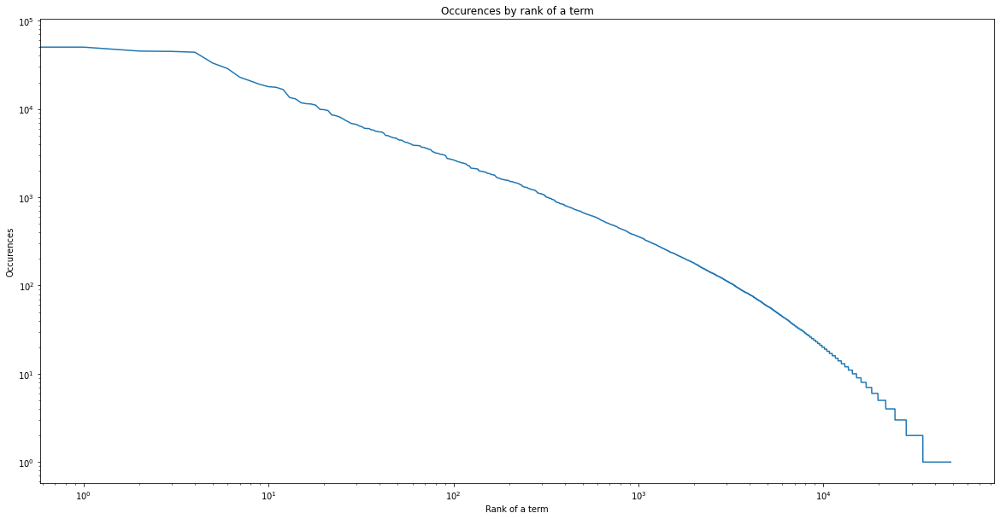

In [61]:
plt.figure(figsize=(20, 10))
plt.plot(freq_df['token'], freq_df['count'])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Rank of a term')
plt.ylabel('Occurences')
plt.title('Occurences by rank of a term')
plt.show()

### 7)

In [62]:
morfeusz = morfeusz2.Morfeusz(analyse=True, generate=True)

In [63]:
morfeusz.analyse('test')

[(0, 1, ('test', 'test', 'subst:sg:nom.acc:m3', ['nazwa_pospolita'], []))]

In [64]:
morfeusz.analyse('asdjasd')

[(0, 1, ('asdjasd', 'asdjasd', 'ign', [], []))]

In [65]:
freq_df['morfeusz'] = freq_df.apply(lambda ign: morfeusz.analyse(ign['token'])[0][2][2], axis=1)
freq_df_ign = freq_df[freq_df['morfeusz'] == 'ign']

In [66]:
freq_df_non_ign = freq_df[freq_df['morfeusz'] != 'ign']

In [67]:
freq_df_ign

,token,count,morfeusz
28984,gmo,192,ign
43201,skw,184,ign
26919,ex,155,ign
46210,ike,116,ign
33556,kn,84,ign
...,...,...,...
38309,homeopatrycznego,1,ign
38323,pocedury,1,ign
23240,trzymie,1,ign
23241,sięcznego,1,ign


### 8)

In [68]:
freq_highest = freq_df_ign.iloc[:30, :]
freq_highest

,token,count,morfeusz
28984,gmo,192,ign
43201,skw,184,ign
26919,ex,155,ign
46210,ike,116,ign
33556,kn,84,ign
37952,cn,77,ign
43845,uke,74,ign
22844,ure,74,ign
615,sww,72,ign
36683,phs,52,ign


### 9)

In [69]:
freq_random = freq_df_ign[(freq_df_ign['count'] == 5)]
freq_random.shape

(25, 3)

There's 25 words with 5 occurences so I will take all of them

### 10)

In [70]:
def levenshtein(a, b):
    n, m = len(a), len(b)
    if n > m:
        a,b = b,a
        n,m = m,n
        
    current = range(n+1)
    for i in range(1,m+1):
        previous, current = current, [i]+[0]*n
        for j in range(1,n+1):
            add, delete = previous[j]+1, current[j-1]+1
            change = previous[j-1]
            if a[j-1] != b[i-1]:
                change = change + 1
            current[j] = min(add, delete, change)
            
    return current[n]

In [71]:
existing_words = freq_df_non_ign['token'].tolist()

In [72]:
random_word = freq_highest.iloc[3, 0]
random_word

'ike'

In [73]:
def fix_word(word):
    return min(existing_words, key=lambda x: levenshtein(word, x))

In [74]:
fix_word(random_word)

'ile'

In [75]:
start = datetime.now()

freq_highest.reset_index(drop=True, inplace=True)
freq_highest.loc[:, 'frequency_levenshtein'] = freq_highest.apply(lambda x: fix_word(x['token']), axis=1)

freq_random.reset_index(drop=True, inplace=True)
freq_random.loc[:, 'frequency_levenshtein'] = freq_random.apply(lambda x: fix_word(x['token']), axis=1)

time = datetime.now() - start
print("Time of operation: {}".format(time))

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


Time of operation: 0:00:56.632994


In [76]:
freq_highest

,token,count,morfeusz,frequency_levenshtein
0,gmo,192,ign,go
1,skw,184,ign,kw
2,ex,155,ign,ix
3,ike,116,ign,ile
4,kn,84,ign,on
5,cn,77,ign,co
6,uke,74,ign,ue
7,ure,74,ign,ue
8,sww,72,ign,swe
9,phs,52,ign,prs


In [77]:
freq_random

,token,count,morfeusz,frequency_levenshtein
0,nawozw,5,ign,nawozu
1,ami,5,ign,ani
2,biuretu,5,ign,biurem
3,ośc,5,ign,oś
4,zawart,5,ign,zawarte
5,polichlorowane,5,ign,pochowane
6,agave,5,ign,dane
7,ktrej,5,ign,której
8,nfośigw,5,ign,nowego
9,przepisw,5,ign,przepisy


In [78]:
es = Elasticsearch("http://localhost:9200",verify_certs=True)

In [79]:
index_body={
    "settings": {
        "index":{
            'analysis': {
                "analyzer": {
                    "polish":{
                        "type": "custom",
                        "tokenizer": "keyword"
                    }
                }
            }
        }
    },
    "mappings": {
        "_doc": {
            "properties": {
                "text": {
                    "type": "text",
                    "analyzer": "polish"
                }
            }
        }
    }
}

In [80]:
try:
    es.indices.delete('polish_sgjp')
except:
    print("Index not created yet.")

In [81]:
es.indices.create(index='polish_sgjp', include_type_name=True, body=index_body)

C:\ProgramData\Anaconda3\lib\site-packages\elasticsearch\connection\base.py:193: ElasticsearchDeprecationWarning: [types removal] Using include_type_name in create index requests is deprecated. The parameter will be removed in the next major version.
  warnings.warn(message, category=ElasticsearchDeprecationWarning)


{'acknowledged': True, 'shards_acknowledged': True, 'index': 'polish_sgjp'}

In [82]:
def insert_sgjp_to_elastic(file):
    with open(file, encoding="UTF-8") as file:
        # skip header and license, later proper rows have 4 elements divided with tabs, where 1st is the word
        for line in file:
            if len(line.split()) != 4:
                continue
            else:
                yield {
                    "_index": "polish_sgjp",
                    "word": line.split()[0],
                }
                break
        
        i = 0
        for line in file:
            yield {
                "_index": "polish_sgjp",
                "word": line.split()[0],
            }
            
            i += 1
            if i % 100000 == 0:
                print(i)

filename = "sgjp-20211121.tab"

helpers.bulk(es, insert_sgjp_to_elastic(filename), chunk_size=100000, request_timeout=6000)

100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000
1100000
1200000
1300000
1400000
1500000
1600000
1700000
1800000
1900000
2000000
2100000
2200000
2300000
2400000
2500000
2600000
2700000
2800000
2900000
3000000
3100000
3200000
3300000
3400000
3500000
3600000
3700000
3800000
3900000
4000000
4100000
4200000
4300000
4400000
4500000
4600000
4700000
4800000
4900000
5000000
5100000
5200000
5300000
5400000
5500000
5600000
5700000
5800000
5900000
6000000
6100000
6200000
6300000
6400000
6500000
6600000
6700000
6800000
6900000
7000000
7100000
7200000
7300000
7400000


(7409505, [])

In [83]:
start = datetime.now()
for index, row in freq_highest.iterrows():
    search = es.search(index='polish_sgjp',
                      size=2,
                      body = {
                          "query" : {
                              "fuzzy": {
                                  "word": row['token']
                                      },
                                  }})
    try:
        freq_highest.loc[index, 'elastic_sgjp'] = search['hits']['hits'][0]['_source']['word']
    except:
        pass

for index, row in freq_random.iterrows():
    search = es.search(index='polish_sgjp',
                      size=2,
                      body = {
                          "query" : {
                              "fuzzy": {
                                  "word": row['token']
                                      },
                                  }})
    try:
        freq_random.loc[index, 'elastic_sgjp'] = search['hits']['hits'][0]['_source']['word']
    except:
        pass
time = datetime.now() - start
print("Time of operation: {}".format(time))

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Time of operation: 0:00:02.790527


In [84]:
freq_highest

,token,count,morfeusz,frequency_levenshtein,elastic_sgjp
0,gmo,192,ign,go,Gamo
1,skw,184,ign,kw,PKW
2,ex,155,ign,ix,NaN
3,ike,116,ign,ile,IKE-ach
4,kn,84,ign,on,NaN
5,cn,77,ign,co,NaN
6,uke,74,ign,ue,UKF
7,ure,74,ign,ue,BRE
8,sww,72,ign,swe,Saw
9,phs,52,ign,prs,PBS


In [85]:
freq_random

,token,count,morfeusz,frequency_levenshtein,elastic_sgjp
0,nawozw,5,ign,nawozu,Nawoza
1,ami,5,ign,ani,AM-ami
2,biuretu,5,ign,biurem,biureta
3,ośc,5,ign,oś,Owc
4,zawart,5,ign,zawarte,Gawart
5,polichlorowane,5,ign,pochowane,polichromowane
6,agave,5,ign,dane,agape
7,ktrej,5,ign,której,karej
8,nfośigw,5,ign,nowego,NaN
9,przepisw,5,ign,przepisy,przepisu


### --the distribution of words in the corpus
Corpus consists of many abbreviations and shortened versions of words, as well as many words written with spelling errors. There are also some words which should be in the dictionary, e.g. "gmo"
### --the number of true misspellings vs. the number of unknown words
Majority of those cases are probably legislatively common abbreviations, but it's not that clear to decide without reading the full text
### --the performance of your method compared to ElasticSearch
Apart of loading the data to the ES index, the main performance is much better on ES side.
### --the results provided by your method compared to ElasticSearch
As it can be seen in the two tables above, it's hard to declare one option better than the other - ElasticSearch didn't manage to fix some of the words (we got NaN values), and some of them probably make much more sense in the levenshtein solution - e.g. "zawart" is "zawarte" with levenshtein, but "Gawart" with ES. It needs to be remembered however that the levenshtein version takes from the words already present in the legislative acts, while ES uses the whole dictionary. Because if that, it can make much more sense to use the versions fixed by levenshtein.
### --the validity of the obtained corrections
Some corrections seem valid, while some look like they are completely out of place. A larger sample wound be needed to grade these kind of correction methods. However, considering only the data above, there's not many cases where ES outperfomed the levenshtein method when it comes to correctness.